# DEFOM-Stereo 

Почему именно она:
 - Использует энкодер Depth Anything V2 как источник глобального понимания сцены и устойчивого priors по глубине.
 - Встроенный RAFT-подобный рекуррентный решатель уточняет карту диспаритета шаг за шагом, доводя её до субпиксельной точности.
 - Модель доступна с публичными весами, обученными на крупных наборах (SceneFlow, KITTI, ETH3D, Robust Vision Challenge), что сразу обеспечивает высокую переносимость на новые данные без трудоёмкой дообучаемости.
 - Поддерживает смешанную точность (mixed precision), что позволяет запускать её на больших изображениях в пределах памяти современных GPU, делая её применимой не только для исследований, но и для инженерных прототипов.


In [4]:
from pathlib import Path
import sys

PROJECT_ROOT = Path.cwd().parent
DATA_ROOT = PROJECT_ROOT / "data" / "instereo2k_sample"
OUTPUT_ROOT = PROJECT_ROOT / "results" / "task1_defomstereo"
DEFOM_ROOT = (PROJECT_ROOT.parent / "DEFOM-Stereo").resolve()
CHECKPOINT_PATH = DEFOM_ROOT / "checkpoints" / "defomstereo_vitl_sceneflow.pth"

required_paths = [
    (DATA_ROOT, "DATA_ROOT"),
    (DEFOM_ROOT, "DEFOM_ROOT"),
    (CHECKPOINT_PATH, "CHECKPOINT_PATH"),
]
for path_obj, label in required_paths:
    if not path_obj.exists():
        raise FileNotFoundError(f"{label} not found: {path_obj}")

OUTPUT_ROOT.mkdir(parents=True, exist_ok=True)

for candidate in (DEFOM_ROOT, DEFOM_ROOT / "core"):
    candidate_str = str(candidate)
    if candidate_str not in sys.path:
        sys.path.append(candidate_str)

print(f"Project root: {PROJECT_ROOT}")
print(f"Samples dir:  {DATA_ROOT}")
print(f"Checkpoint:   {CHECKPOINT_PATH.name}")
print(f"Results ->    {OUTPUT_ROOT}")

Project root: /Users/olgashalashova/dl-cv-home-test
Samples dir:  /Users/olgashalashova/dl-cv-home-test/data/instereo2k_sample
Checkpoint:   defomstereo_vitl_sceneflow.pth
Results ->    /Users/olgashalashova/dl-cv-home-test/results/task1_defomstereo


In [9]:
import json
import random
from types import SimpleNamespace

import numpy as np
import torch
from PIL import Image
from matplotlib import pyplot as plt
from tqdm.auto import tqdm

from core.defom_stereo import DEFOMStereo
from core.utils.utils import InputPadder

DEFAULT_SAMPLE_COUNT = 10
DEFAULT_RANDOM_SEED = 42
DEFAULT_VISUALIZE_COUNT = 5


def select_device() -> torch.device:
    if torch.cuda.is_available():
        return torch.device("cuda")
    has_mps = getattr(torch.backends, "mps", None)
    if has_mps and torch.backends.mps.is_available():
        return torch.device("mps")
    return torch.device("cpu")


DEVICE = select_device()
use_mixed_precision = DEVICE.type == "cuda"

if DEVICE.type == "cuda":
    torch.set_float32_matmul_precision("medium")
    torch.backends.cuda.matmul.allow_tf32 = True

model_args = SimpleNamespace(
    restore_ckpt=str(CHECKPOINT_PATH),
    mixed_precision=use_mixed_precision,
    valid_iters=32,
    scale_iters=8,
    dinov2_encoder="vitl",
    idepth_scale=0.5,
    hidden_dims=[128, 128, 128],
    corr_implementation="reg",
    shared_backbone=False,
    corr_levels=2,
    corr_radius=4,
    scale_list=[0.125, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5, 2.0],
    scale_corr_radius=2,
    n_downsample=2,
    context_norm="batch",
    n_gru_layers=3,
)

model = DEFOMStereo(model_args)
state = torch.load(CHECKPOINT_PATH, map_location="cpu")
if "model" in state:
    state = state["model"]
model.load_state_dict(state)
model.to(DEVICE)
model.eval()

print(f" Model loaded from {CHECKPOINT_PATH.name}")
print(f"   Device: {DEVICE}, mixed_precision={use_mixed_precision}")


 Model loaded from defomstereo_vitl_sceneflow.pth
   Device: mps, mixed_precision=False


In [10]:
from contextlib import nullcontext
from pprint import pprint

def load_image_tensor(path: Path) -> torch.Tensor:
    img = Image.open(path).convert("RGB")
    tensor = torch.from_numpy(np.asarray(img, dtype=np.uint8)).permute(2, 0, 1).float()
    return tensor.unsqueeze(0)


def collect_left_images(root: Path):
    return sorted(root.glob("*/left.png"))


def run_inference(
    model: torch.nn.Module,
    limit: int | None = DEFAULT_SAMPLE_COUNT,
    sample_ids: list[str] | None = None,
    save_numpy: bool = True,
    colormap: str = "turbo",
    random_seed: int | None = DEFAULT_RANDOM_SEED,
):
    left_images = collect_left_images(DATA_ROOT)
    if sample_ids is not None:
        sample_ids_set = {str(s) for s in sample_ids}
        left_images = [p for p in left_images if p.parent.name in sample_ids_set]

    if limit is not None and len(left_images) > limit:
        rng = random.Random(random_seed)
        left_images = sorted(rng.sample(left_images, limit), key=lambda p: p.parent.name)
    elif limit is not None:
        left_images = left_images[:limit]

    if not left_images:
        print("Нет сэмплов для инференса — проверьте фильтры.")
        return []

    processed = []

    with torch.inference_mode():
        for left_path in tqdm(left_images, desc="DEFOM inference"):
            right_path = left_path.parent / "right.png"

            left_tensor = load_image_tensor(left_path).to(DEVICE)
            right_tensor = load_image_tensor(right_path).to(DEVICE)

            padder = InputPadder(left_tensor.shape, divis_by=32)
            left_padded, right_padded = padder.pad(left_tensor, right_tensor)

            ctx_manager = (
                torch.autocast(device_type="cuda", dtype=torch.float16)
                if use_mixed_precision
                else nullcontext()
            )

            with ctx_manager:
                disp_pred = model(
                    left_padded,
                    right_padded,
                    iters=model_args.valid_iters,
                    scale_iters=model_args.scale_iters,
                    test_mode=True,
                )

            disp = padder.unpad(disp_pred).cpu().squeeze().numpy().astype(np.float32)

            sample_id = left_path.parent.name
            tag = f"{sample_id}_{CHECKPOINT_PATH.stem}"

            png_path = OUTPUT_ROOT / f"{tag}.png"
            plt.imsave(png_path, disp, cmap=colormap)

            npy_filename = None
            if save_numpy:
                npy_path = OUTPUT_ROOT / f"{tag}.npy"
                np.save(npy_path, disp)
                npy_filename = npy_path.name

            processed.append(
                {
                    "sample_id": sample_id,
                    "left": str(left_path.relative_to(PROJECT_ROOT)),
                    "right": str(right_path.relative_to(PROJECT_ROOT)),
                    "png": png_path.name,
                    "npy": npy_filename,
                    "disp_min": float(disp.min()),
                    "disp_max": float(disp.max()),
                }
            )

    metadata = {
        "checkpoint": str(CHECKPOINT_PATH),
        "device": DEVICE.type,
        "mixed_precision": use_mixed_precision,
        "num_samples": len(processed),
        "limit": limit,
        "random_seed": random_seed,
        "save_numpy": save_numpy,
        "samples": processed,
        "selected_samples": [sample["sample_id"] for sample in processed],
    }

    (OUTPUT_ROOT / "metadata.json").write_text(json.dumps(metadata, indent=2))
    return processed


In [11]:
processed_samples = run_inference(
    model,
    limit=DEFAULT_SAMPLE_COUNT,
    save_numpy=True,
    colormap="turbo",
    random_seed=DEFAULT_RANDOM_SEED,
)

selected_sample_ids = [sample["sample_id"] for sample in processed_samples]

print(f"\nСохранено {len(processed_samples)} disparity-карт в {OUTPUT_ROOT}")
if processed_samples:
    pprint(processed_samples[:3])


DEFOM inference:   0%|          | 0/10 [00:00<?, ?it/s]

/var/folders/xr/2b71grmx5nsglymf7xzjs9jr0000gn/T/ipykernel_96700/1722867885.py:6: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_numpy.cpp:209.)
  tensor = torch.from_numpy(np.asarray(img, dtype=np.uint8)).permute(2, 0, 1).float()
/Users/olgashalashova/DEFOM-Stereo/core/defom_stereo.py:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=self.args.mixed_precision):
/opt/anaconda3/lib/python3.12/site-packages/torch/functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required 


Сохранено 10 disparity-карт в /Users/olgashalashova/dl-cv-home-test/results/task1_defomstereo
[{'disp_max': 78.40472412109375,
  'disp_min': 28.792184829711914,
  'left': 'data/instereo2k_sample/000413/left.png',
  'npy': '000413_defomstereo_vitl_sceneflow.npy',
  'png': '000413_defomstereo_vitl_sceneflow.png',
  'right': 'data/instereo2k_sample/000413/right.png',
  'sample_id': '000413'},
 {'disp_max': 65.82722473144531,
  'disp_min': 40.282127380371094,
  'left': 'data/instereo2k_sample/000454/left.png',
  'npy': '000454_defomstereo_vitl_sceneflow.npy',
  'png': '000454_defomstereo_vitl_sceneflow.png',
  'right': 'data/instereo2k_sample/000454/right.png',
  'sample_id': '000454'},
 {'disp_max': 76.75670623779297,
  'disp_min': 42.127071380615234,
  'left': 'data/instereo2k_sample/000459/left.png',
  'npy': '000459_defomstereo_vitl_sceneflow.npy',
  'png': '000459_defomstereo_vitl_sceneflow.png',
  'right': 'data/instereo2k_sample/000459/right.png',
  'sample_id': '000459'}]


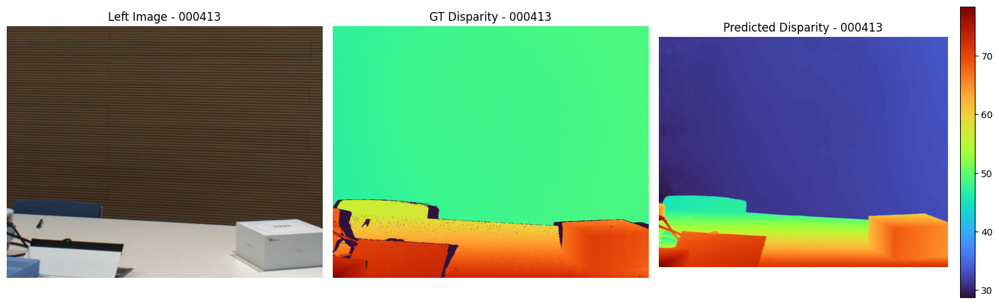

Sample: 000413
Disparity range: [28.792, 78.405]
Disparity shape: (860, 1080)
--------------------------------------------------


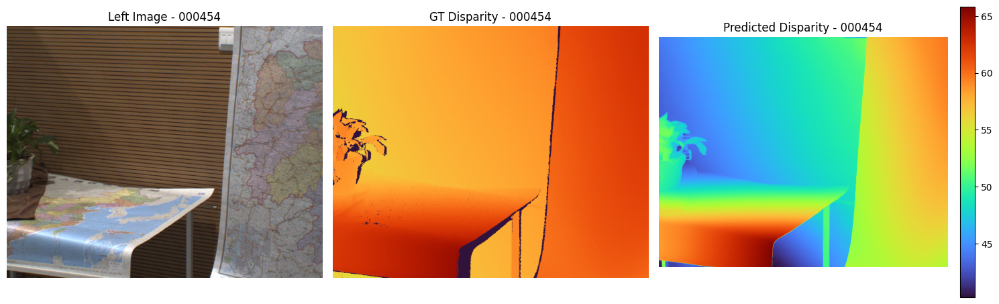

Sample: 000454
Disparity range: [40.282, 65.827]
Disparity shape: (860, 1080)
--------------------------------------------------


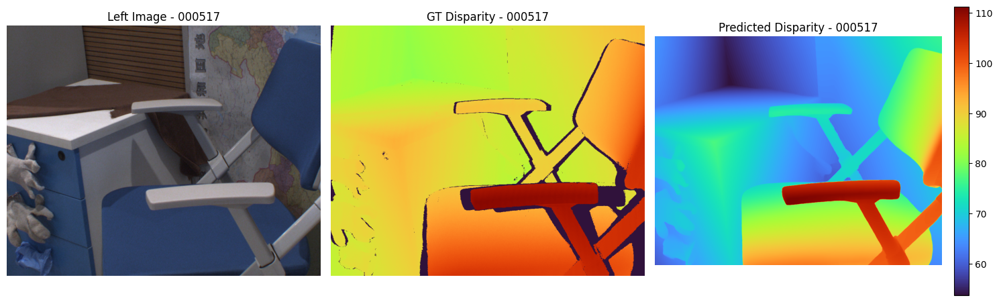

Sample: 000517
Disparity range: [53.677, 111.279]
Disparity shape: (860, 1080)
--------------------------------------------------


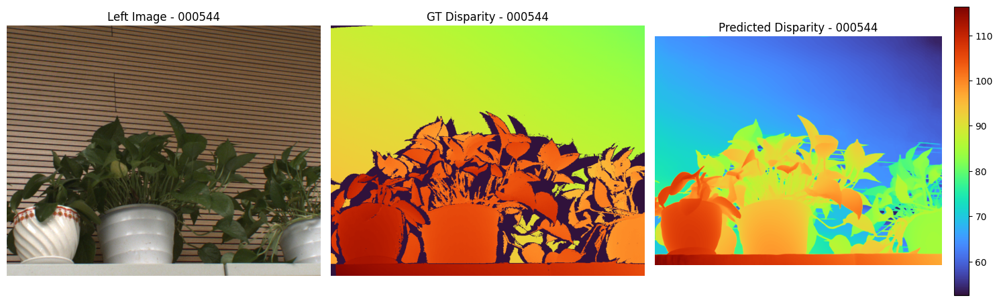

Sample: 000544
Disparity range: [52.508, 116.421]
Disparity shape: (860, 1080)
--------------------------------------------------


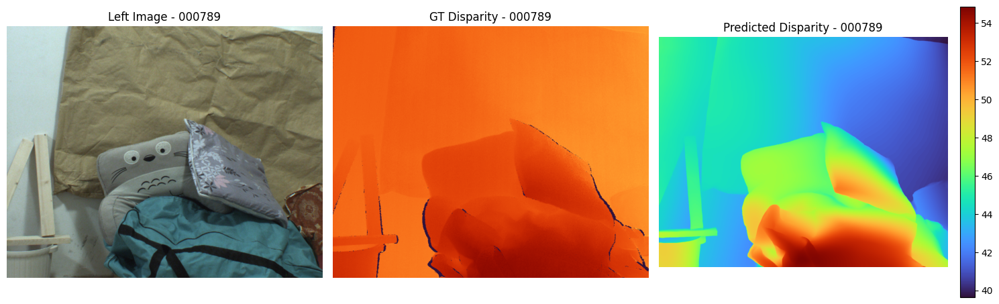

Sample: 000789
Disparity range: [39.640, 54.862]
Disparity shape: (860, 1080)
--------------------------------------------------


In [12]:
def visualize_from_npy(
    processed_samples,
    sample_ids=None,
    colormap="turbo",
    max_items=DEFAULT_VISUALIZE_COUNT,
    random_seed=DEFAULT_RANDOM_SEED,
):
    if not processed_samples:
        print("Нет данных для визуализации.")
        return

    available = processed_samples
    if sample_ids is not None:
        sample_filter = {str(sid) for sid in sample_ids}
        available = [sample for sample in processed_samples if sample["sample_id"] in sample_filter]

    if not available:
        print("Не осталось сэмплов после фильтрации.")
        return

    if max_items is not None and len(available) > max_items:
        rng = random.Random(random_seed)
        available = sorted(rng.sample(available, max_items), key=lambda sample: sample["sample_id"])

    for sample in available:
        sample_id = sample["sample_id"]

        left_img_path = PROJECT_ROOT / sample["left"]
        left_img = Image.open(left_img_path).convert("RGB")

        if sample["npy"]:
            npy_path = OUTPUT_ROOT / sample["npy"]
            pred_disp = np.load(npy_path)
        else:
            pred_disp_path = OUTPUT_ROOT / sample["png"]
            pred_disp = plt.imread(pred_disp_path)

        gt_disp_path = DATA_ROOT / sample_id / "left_disp.png"

        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(left_img)
        plt.title(f"Left Image - {sample_id}")
        plt.axis("off")

        if gt_disp_path.exists():
            gt_disp = Image.open(gt_disp_path)
            plt.subplot(1, 3, 2)
            plt.imshow(gt_disp, cmap=colormap)
            plt.title(f"GT Disparity - {sample_id}")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            im = plt.imshow(pred_disp, cmap=colormap)
            plt.title(f"Predicted Disparity - {sample_id}")
            plt.colorbar(im, fraction=0.046, pad=0.04)
            plt.axis("off")
        else:
            plt.subplot(1, 2, 2)
            im = plt.imshow(pred_disp, cmap=colormap)
            plt.title(f"Predicted Disparity - {sample_id}")
            plt.colorbar(im, fraction=0.046, pad=0.04)
            plt.axis("off")

        plt.tight_layout()
        plt.show()

        print(f"Sample: {sample_id}")
        print(f"Disparity range: [{pred_disp.min():.3f}, {pred_disp.max():.3f}]")
        print(f"Disparity shape: {pred_disp.shape}")
        print("-" * 50)

visualize_from_npy(
    processed_samples,
    sample_ids=selected_sample_ids if 'selected_sample_ids' in globals() else None,
    colormap="turbo",
    max_items=DEFAULT_VISUALIZE_COUNT,
    random_seed=DEFAULT_RANDOM_SEED,
)


## RAFT-Stereo 

Почему именно она:
 - Впервые применяет итеративное уточнение диспаритета: карта глубины не предсказывается за один шаг, а многократно обновляется рекуррентным модулем ConvGRU.
 - Использует all-pairs correlation volume, позволяя строить богатое поле соответствий между изображениями и сохранять больше деталей сцены.
 - Отличается высокой точностью на сложных наборах вроде Middlebury и ETH3D, где важны субпиксельные детали и мелкие структуры.
 - Работает быстрее и эффективнее по памяти, чем тяжёлые 3D-CNN, а итеративная схема позволяет гибко регулировать баланс между скоростью и качеством.


In [21]:
def run_raft_inference(scene_ids, model, ckpt_name, output_root, n_iter=32, colormap="turbo"):
    processed_samples = []
    output_root.mkdir(parents=True, exist_ok=True)

    for idx, sid in enumerate(scene_ids, start=1):
        left_path = DATA_ROOT / sid / "left.png"
        right_path = DATA_ROOT / sid / "right.png"
        gt_path = DATA_ROOT / sid / "left_disp.png"

        if not left_path.exists() or not right_path.exists():
            print(f"[{idx}/{len(scene_ids)}] ⚠️ Файлы для сцены {sid} отсутствуют, пропускаем.")
            continue

        # загрузка и паддинг
        left_tensor = load_image_tensor(left_path).to(DEVICE)
        right_tensor = load_image_tensor(right_path).to(DEVICE)
        padder = RAFTInputPadder(left_tensor.shape)
        left_padded, right_padded = padder.pad(left_tensor, right_tensor)

        # инференс
        with torch.inference_mode():
            with (torch.autocast("cuda", dtype=torch.float16) if DEVICE.type == "cuda" else contextlib.nullcontext()):
                _, disp = model(left_padded, right_padded, iters=n_iter, test_mode=True)

        disp_map = padder.unpad(disp)[0, 0].detach().cpu().numpy()

        # сохранение
        out_png = output_root / f"{sid}_{ckpt_name}_disp.png"
        out_npy = output_root / f"{sid}_{ckpt_name}_disp.npy"
        plt.imsave(out_png, disp_map, cmap=colormap)
        np.save(out_npy, disp_map)

        processed_samples.append({
            "sample_id": sid,
            "left": str(left_path),
            "png": str(out_png),
            "npy": str(out_npy),
            "gt": str(gt_path) if gt_path.exists() else None,
        })

        print(f"[{idx}/{len(scene_ids)}] ✅ disparity saved → {out_png}, {out_npy}")

    return processed_samples


def visualize_raft(processed_samples, colormap="turbo", max_items=5, random_seed=42):
    if not processed_samples:
        print("Нет данных для визуализации.")
        return

    available = processed_samples
    if max_items is not None and len(available) > max_items:
        rng = random.Random(random_seed)
        available = sorted(rng.sample(available, max_items), key=lambda s: s["sample_id"])

    for sample in available:
        sid = sample["sample_id"]
        left_img = Image.open(sample["left"]).convert("RGB")
        pred_disp = np.load(sample["npy"])
        gt_path = sample["gt"]

        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(left_img)
        plt.title(f"Left Image - {sid}")
        plt.axis("off")

        if gt_path and Path(gt_path).exists():
            gt_disp = np.array(Image.open(gt_path), dtype=np.float32) / 100.0

            mask = np.isfinite(gt_disp) & (gt_disp > 0)
            diff = pred_disp - gt_disp
            abs_err = np.abs(diff)[mask]
            sq_err = (diff ** 2)[mask]

            mae = abs_err.mean() if mask.any() else float("nan")
            rmse = np.sqrt(sq_err.mean()) if mask.any() else float("nan")

            plt.subplot(1, 3, 2)
            plt.imshow(gt_disp, cmap=colormap)
            plt.title(f"GT disparity - {sid}")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            im = plt.imshow(pred_disp, cmap=colormap)
            plt.title(f"Predicted disparity\nMAE={mae:.3f}px RMSE={rmse:.3f}px")
            plt.colorbar(im, fraction=0.046, pad=0.04)
            plt.axis("off")
        else:
            plt.subplot(1, 2, 2)
            im = plt.imshow(pred_disp, cmap=colormap)
            plt.title(f"Predicted disparity - {sid}")
            plt.colorbar(im, fraction=0.046, pad=0.04)
            plt.axis("off")

        plt.tight_layout()
        plt.show()

        print(f"Sample: {sid}")
        print(f"Disparity range: [{pred_disp.min():.3f}, {pred_disp.max():.3f}]")
        print(f"Disparity shape: {pred_disp.shape}")
        print("-" * 50)



                 

In [16]:
import sys
import torch
import random
import contextlib
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from types import SimpleNamespace

# --- базовые пути ---
PROJECT_ROOT = Path("..").resolve()
DATA_ROOT = PROJECT_ROOT / "data" / "instereo2k_sample"

DEVICE = torch.device("mps" if torch.backends.mps.is_available()
                      else "cuda" if torch.cuda.is_available()
                      else "cpu")

# --- путь до репозитория RAFT-Stereo ---
raft_repo = PROJECT_ROOT.parent / "RAFT-Stereo"
if not (raft_repo / "core" / "raft_stereo.py").exists():
    raise FileNotFoundError(f"RAFT-Stereo не найден по пути {raft_repo}")

# --- очистка старого импорта (чтобы не мешался модуль core) ---
for name in list(sys.modules):
    if name == "core" or name.startswith("core."):
        del sys.modules[name]

sys.path.insert(0, str(raft_repo / "core"))
sys.path.insert(0, str(raft_repo))

# --- импорт модели RAFT-Stereo ---
from core.raft_stereo import RAFTStereo
from core.utils.utils import InputPadder as RAFTInputPadder

# --- аргументы модели ---
raft_args = SimpleNamespace(
    mixed_precision=(DEVICE.type == "cuda"),
    shared_backbone=True,
    corr_implementation="reg",
    corr_radius=4,
    corr_levels=4,
    n_downsample=2,
    context_norm="batch",
    n_gru_layers=3,
    hidden_dims=[128, 128, 128],
    slow_fast_gru=True,
)

# --- поиск чекпоинта ---
ckpt_roots = [PROJECT_ROOT / "models", raft_repo / "models"]
ckpt_variants = [
    "raftstereo-middlebury.pth",
    "raftstereo-eth3d.pth",
    "raftstereo_sceneflow.pth",
    "raftstereo-sceneflow.pth",
]

raft_ckpt = None
for root in ckpt_roots:
    for name in ckpt_variants:
        candidate = root / name
        if candidate.exists():
            raft_ckpt = candidate
            break
    if raft_ckpt:
        break

if raft_ckpt is None:
    raise FileNotFoundError("Чекпоинт RAFT-Stereo не найден. Скачайте модель в папку models/.")

print(f"Используем чекпоинт: {raft_ckpt.name}")

# --- инициализация модели ---
raft_model = RAFTStereo(raft_args).to(DEVICE)
state = torch.load(raft_ckpt, map_location=DEVICE)
if isinstance(state, dict):
    state = state.get("state_dict", state)
    if state and all(k.startswith("module.") for k in state):
        state = {k.replace("module.", "", 1): v for k, v in state.items()}
raft_model.load_state_dict(state, strict=False)
raft_model.eval()

print("RAFT-Stereo успешно загружен.")

# --- список сцен в датасете ---
all_scene_ids = sorted([p.name for p in DATA_ROOT.iterdir() if p.is_dir()])
print(f"Доступно сцен: {len(all_scene_ids)}")


Используем чекпоинт: raftstereo-middlebury.pth
RAFT-Stereo успешно загружен.
Доступно сцен: 390


In [19]:
raft_output_dir = PROJECT_ROOT / "results" / "task1_raft"
sample_ids_for_raft = random.sample(all_scene_ids, k=10)

processed_samples = run_raft_inference(
    sample_ids_for_raft,
    raft_model,
    ckpt_name=raft_ckpt.stem,
    output_root=raft_output_dir,
    n_iter=32,
    colormap="turbo",
)


[1/10] ✅ disparity saved → /Users/olgashalashova/dl-cv-home-test/results/task1_raft/000669_raftstereo-middlebury_disp.png, /Users/olgashalashova/dl-cv-home-test/results/task1_raft/000669_raftstereo-middlebury_disp.npy
[2/10] ✅ disparity saved → /Users/olgashalashova/dl-cv-home-test/results/task1_raft/000637_raftstereo-middlebury_disp.png, /Users/olgashalashova/dl-cv-home-test/results/task1_raft/000637_raftstereo-middlebury_disp.npy
[3/10] ✅ disparity saved → /Users/olgashalashova/dl-cv-home-test/results/task1_raft/000417_raftstereo-middlebury_disp.png, /Users/olgashalashova/dl-cv-home-test/results/task1_raft/000417_raftstereo-middlebury_disp.npy
[4/10] ✅ disparity saved → /Users/olgashalashova/dl-cv-home-test/results/task1_raft/000535_raftstereo-middlebury_disp.png, /Users/olgashalashova/dl-cv-home-test/results/task1_raft/000535_raftstereo-middlebury_disp.npy
[5/10] ✅ disparity saved → /Users/olgashalashova/dl-cv-home-test/results/task1_raft/000454_raftstereo-middlebury_disp.png, /User

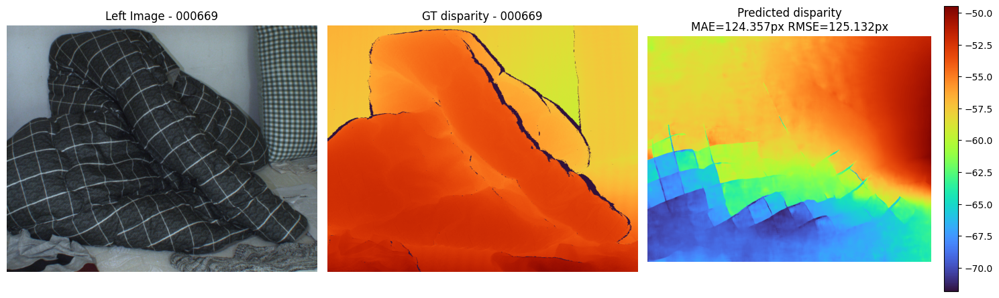

Sample: 000669
Disparity range: [-71.855, -49.496]
Disparity shape: (860, 1080)
--------------------------------------------------


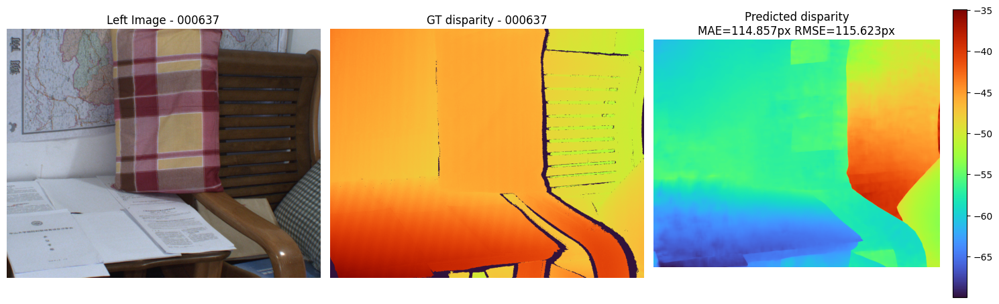

Sample: 000637
Disparity range: [-69.972, -34.961]
Disparity shape: (860, 1080)
--------------------------------------------------


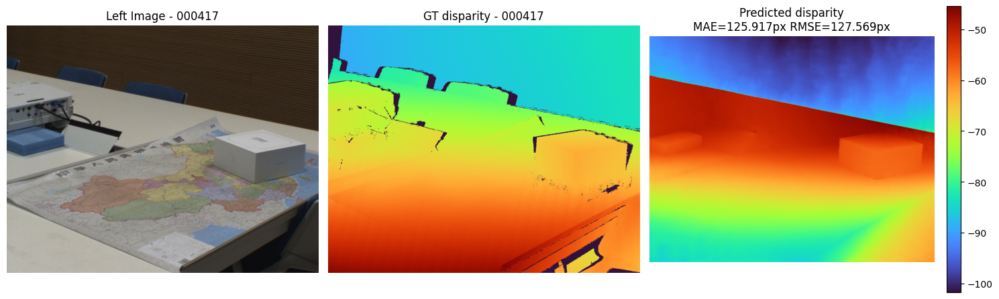

Sample: 000417
Disparity range: [-101.765, -45.411]
Disparity shape: (860, 1080)
--------------------------------------------------


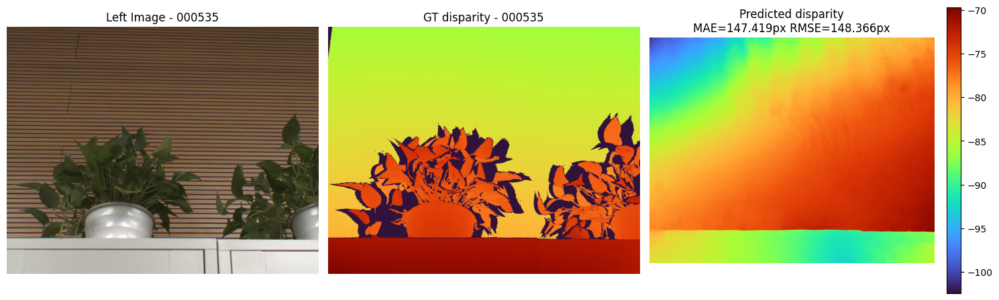

Sample: 000535
Disparity range: [-102.449, -69.725]
Disparity shape: (860, 1080)
--------------------------------------------------


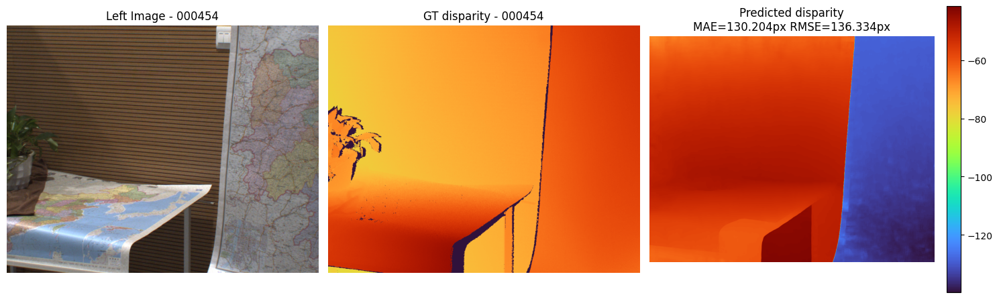

Sample: 000454
Disparity range: [-139.768, -41.415]
Disparity shape: (860, 1080)
--------------------------------------------------


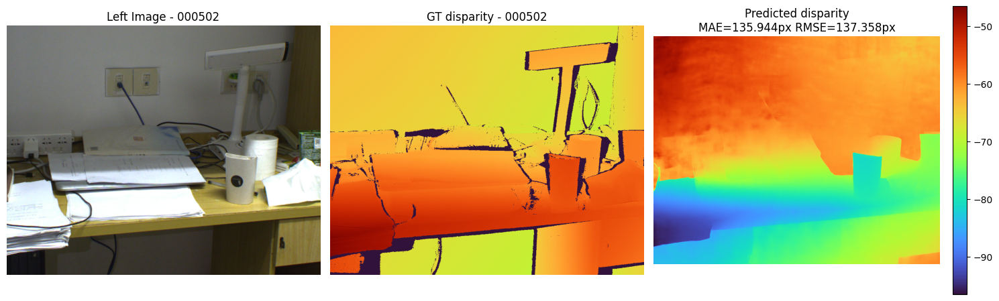

Sample: 000502
Disparity range: [-96.492, -46.613]
Disparity shape: (860, 1080)
--------------------------------------------------


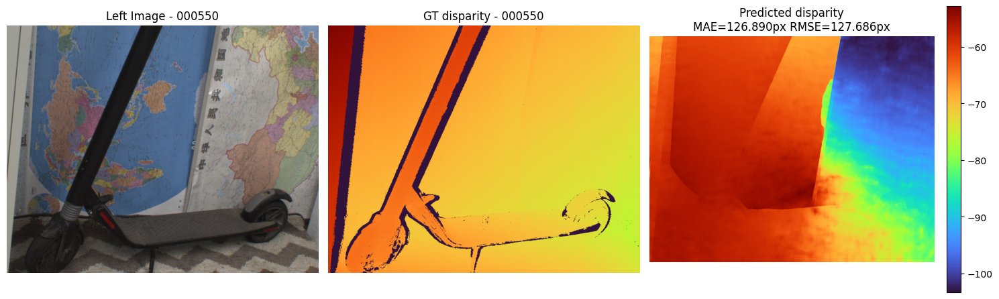

Sample: 000550
Disparity range: [-103.354, -52.835]
Disparity shape: (860, 1080)
--------------------------------------------------


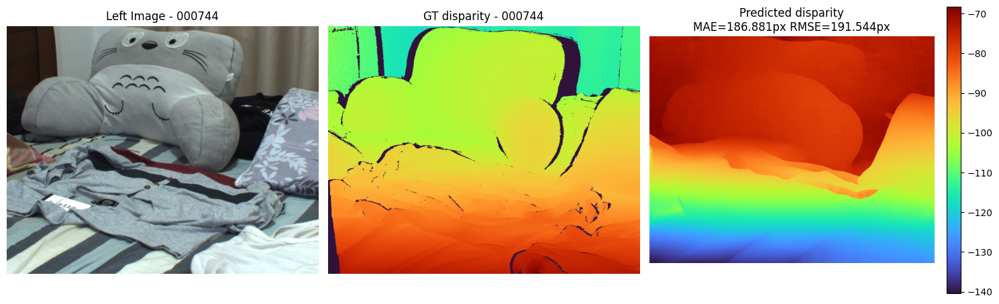

Sample: 000744
Disparity range: [-140.380, -68.260]
Disparity shape: (860, 1080)
--------------------------------------------------


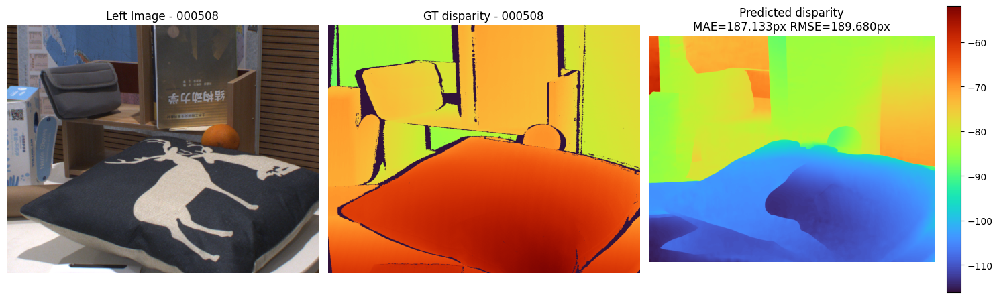

Sample: 000508
Disparity range: [-116.122, -51.941]
Disparity shape: (860, 1080)
--------------------------------------------------


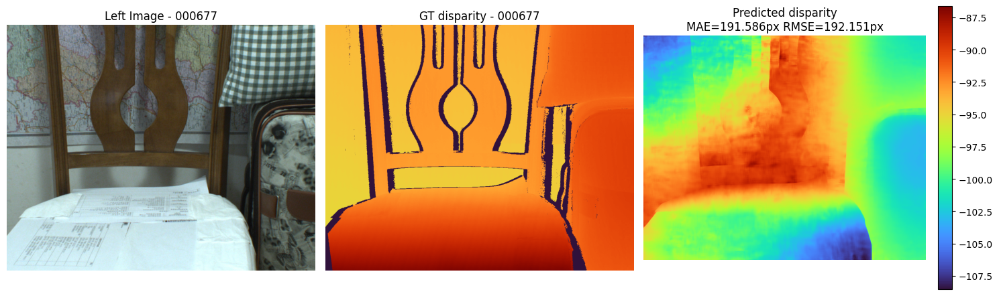

Sample: 000677
Disparity range: [-108.546, -86.628]
Disparity shape: (860, 1080)
--------------------------------------------------


In [22]:
visualize_raft(processed_samples, colormap="turbo", max_items=10)